In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from minisom import MiniSom
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")
import math

In [7]:
df = pd.read_csv("karnataka_dengue_district_level_2017_2023_v1.csv")
dfpop_mean(df)

,District,District_LGD_Code,Record_Year,Record_Week,Population,Geographical_Area,Population_Density,Total_Precipitation,2m_Dewpoint_Temperature,2m_Temperature,Case_Count
0,BAGALKOTE,524,2017,1,1354196.0,5259.0,257.500666,0.000000,8.947083,22.508900,0.0
1,BAGALKOTE,524,2017,2,1354196.0,5259.0,257.500666,0.000104,11.666250,23.404587,0.0
2,BAGALKOTE,524,2017,3,1354196.0,5259.0,257.500666,0.000000,10.396223,24.355046,3.0
3,BAGALKOTE,524,2017,4,1354196.0,5259.0,257.500666,0.008688,13.533519,25.868597,0.0
4,BAGALKOTE,524,2017,5,1354196.0,5259.0,257.500666,0.000000,10.353649,25.991839,1.0
...,...,...,...,...,...,...,...,...,...,...,...
11279,YADGIR,635,2023,48,761299.0,3043.0,250.180414,0.424351,20.708387,27.342057,0.0
11280,YADGIR,635,2023,49,761299.0,3043.0,250.180414,0.424351,20.708387,27.342057,0.0
11281,YADGIR,635,2023,50,761299.0,3043.0,250.180414,0.424351,20.708387,27.342057,0.0
11282,YADGIR,635,2023,51,761299.0,3043.0,250.180414,0.424351,20.708387,27.342057,0.0


In [8]:
def pop_mean(df):
    df['Case_Count'] = df['Case_Count'] / (df['Population'] / 10000000)
    #df['MALARIA'] = df['MALARIA'] / (df['POPULATION'] / 10000000)
    return df

In [9]:
df = pop_mean(df)

In [3]:
def filter_and_plot_weekly_averages(csv_name, num_columns):
    
    df = pd.read_csv(csv_name)
    df_filtered = df[~df['Record_Year'].isin([2020, 2021])]
    #df_filtered = df_filtered[~((df_filtered['Record_Year'] == 2023) #& (df_filtered['Record_Week'] > 45))]
    df_filtered = df_filtered[~((df_filtered['Record_Week'] >  45))]
    column_legend_list = [
        ('2m_Temperature', '2MT'),
        ('2m_Dewpoint_Temperature', '2MDT'),
        ('Total_Precipitation', 'T.P'),
        ('Case_Count', 'C.C')
    ]
    
    # Check if the number of columns to plot is valid
    if num_columns > len(column_legend_list):
        raise ValueError("Number of columns to plot exceeds the provided column legend list length.")
    
    # Calculate weekly averages for the filtered DataFrame
    weekly_averages = df_filtered.groupby('Record_Week').mean()

    # Plot each specified column with the desired legend names
    for i in range(num_columns):
        column_name, legend_label = column_legend_list[i]
        plt.plot(weekly_averages.index, weekly_averages[column_name], label=legend_label)
    
    #print(df['District'].unique())

    # Customize the plot with titles and labels
    plt.title('Weekly Average')
    plt.xlabel('Week Number')
    plt.ylabel('Average Value')
    plt.legend()  # This will use the labels provided in the plot calls
    plt.show()
    
    return df_filtered

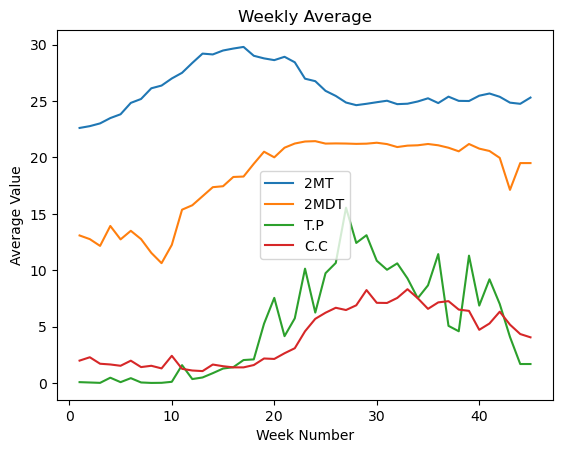

In [4]:
csv_name = "karnataka_dengue_district_level_2017_2023_v1.csv"
df_filtered = filter_and_plot_weekly_averages(csv_name, 4)


In [5]:
def dpl(df,num_columns):
    column_legend_list = [
        ('2m_Temperature', '2MT'),
        ('2m_Dewpoint_Temperature', '2MDT'),
        ('Total_Precipitation', 'T.P'),
        ('Case_Count', 'C.C')
    ]
    
    # Check if the number of columns to plot is valid
    if num_columns > len(column_legend_list):
        raise ValueError("Number of columns to plot exceeds the provided column legend list length.")
    
    # Calculate weekly averages for the filtered DataFrame
    weekly_averages = df.groupby('Record_Week').mean()

    # Plot each specified column with the desired legend names
    for i in range(num_columns):
        column_name, legend_label = column_legend_list[i]
        plt.plot(weekly_averages.index, weekly_averages[column_name], label=legend_label)
    
    print(df['District'].unique())

    # Customize the plot with titles and labels
    plt.title('Weekly Average')
    plt.xlabel('Week Number')
    plt.ylabel('Average Value')
    plt.legend()  # This will use the labels provided in the plot calls
    plt.show()

['BAGALKOTE' 'BALLARI' 'BELAGAVI' 'BENGALURU RURAL' 'BENGALURU URBAN'
 'BIDAR' 'CHAMARAJANAGARA' 'CHIKKABALLAPURA' 'CHIKKAMAGALURU'
 'CHITRADURGA' 'DAKSHINA KANNADA' 'DAVANGERE' 'DHARWAD' 'GADAG' 'HASSAN'
 'HAVERI' 'KALABURAGI' 'KODAGU' 'KOLAR' 'KOPPAL' 'MANDYA' 'MYSURU'
 'RAICHUR' 'RAMANAGARA' 'SHIVAMOGGA' 'TUMAKURU' 'UDUPI' 'UTTARA KANNADA'
 'VIJAYANAGAR' 'VIJAYAPURA' 'YADGIR']


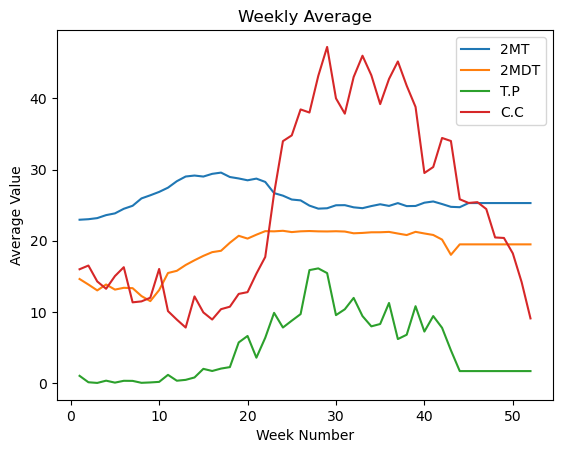

In [10]:
dpl(df,4)

In [11]:
def district_df(df_main,district_name):   
    df_c = df_main.loc[df_main['District'] == district_name]
    df_c = df_c[["2m_Temperature","2m_Dewpoint_Temperature","Total_Precipitation","Case_Count"]]
    df_c = df_c.dropna()
    df_c = df_c.reset_index()
    df_c = df_c.drop("index",axis=1)
    return df_c

In [12]:
def select_district(df_main):
    # Print the unique districts
    unique_districts = df_main['District'].unique()
    print("Available districts:", unique_districts)
    
    # Ask the user to type the district they want
    district_name = input("Please type the district you want: ")
    
    # Check if the entered district is in the list of unique districts
    if district_name in unique_districts:
        return district_name
    else:
        print("The district you typed is not in the list. Please try again.")
        return None  # or you can loop until a valid district is entered

    

In [74]:
# Example usage:
df_main = df_filtered  # Your main dataframe
selected_district = select_district(df_main)
if selected_district:
    district_data = district_df(df_main, selected_district)
    # Now you can use district_data for further processing
    

Available districts: ['BAGALKOTE' 'BALLARI' 'BELAGAVI' 'BENGALURU RURAL' 'BENGALURU URBAN'
 'BIDAR' 'CHAMARAJANAGARA' 'CHIKKABALLAPURA' 'CHIKKAMAGALURU'
 'CHITRADURGA' 'DAKSHINA KANNADA' 'DAVANGERE' 'DHARWAD' 'GADAG' 'HASSAN'
 'HAVERI' 'KALABURAGI' 'KODAGU' 'KOLAR' 'KOPPAL' 'MANDYA' 'MYSURU'
 'RAICHUR' 'RAMANAGARA' 'SHIVAMOGGA' 'TUMAKURU' 'UDUPI' 'UTTARA KANNADA'
 'VIJAYANAGAR' 'VIJAYAPURA' 'YADGIR']
Please type the district you want: UDUPI


In [75]:
district_data

,2m_Temperature,2m_Dewpoint_Temperature,Total_Precipitation,Case_Count
0,24.531883,18.704610,0.009313,0.0
1,23.927355,18.034263,0.000000,0.0
2,25.545367,17.273592,0.003163,0.0
3,27.197101,19.003608,0.164816,0.0
4,26.986351,21.420422,0.124207,0.0
...,...,...,...,...
220,26.410742,24.057283,8.433289,4.0
221,26.519410,24.016558,9.000440,1.0
222,26.888937,22.648223,2.487389,3.0
223,25.755695,22.705504,4.993689,3.0


In [14]:
def weekly_avg(df,num):
    week_avg = df.rolling(window=num).mean()
    week_avg = week_avg.dropna()
    week_avg = week_avg.dropna()
    week_avg = week_avg.reset_index(drop=True)
    new_df = week_avg.iloc[:, :-1]
    scaler = StandardScaler()
    standardized_data = scaler.fit_transform(new_df)
    return week_avg,standardized_data

In [33]:
def train_som(scaled_features, noc,sigma,learning_rate,iterations):#, threshold, patience):
    som_shape = (noc, noc) #Sets the shape of the SOM grid based on noc
    som = MiniSom(som_shape[0], som_shape[1], scaled_features.shape[1], sigma=sigma, learning_rate=learning_rate,
                  neighborhood_function='gaussian', random_seed=10)
    #Creates a MiniSom object with the defined shape, number of features in scaled_features, initial sigma 
    #and learning rate, a Gaussian neighborhood function, and a fixed random seed for reproducibility.
   
    som.random_weights_init(scaled_features)
    #Initializes the SOM weights randomly using the provided features.

    max_iter = iterations #Defines the maximum number of training iterations.
    q_error = [] #List to store quantization.
    t_error = [] #List to store topographic errors during training.
    stable_count = 0 #Counter to track consecutive iterations with insignificant error changes.
    stop_iteration =0 # Variable to store the iteration at which training stops





    for i in range(max_iter):
        rand_i = np.random.randint(len(scaled_features)) #Selects a random index from the scaled features
        som.update(scaled_features[rand_i], som.winner(scaled_features[rand_i]), i, max_iter)
        #Updates the SOM weights based on the randomly selected feature and the current iteration and maximum iteration.
        q_error.append(som.quantization_error(scaled_features)) #Stores the quantization error after the update.
        t_error.append(som.topographic_error(scaled_features)) #Stores the topographic error after the update.


#         if i > 0:
#             delta_q_error = abs(q_error[i] - q_error[i - 1])
#             delta_t_error = abs(t_error[i] - t_error[i - 1])
#             if delta_q_error < threshold and delta_t_error < threshold:
#                 stable_count += 1
#             else:
#                 stable_count = 0

#         if stable_count >= patience:
#             print(f"Training stopped at iteration {i} as the change in error is below the threshold for {patience} consecutive iterations.")
#             stop_iteration = i
#             break

    plt.plot(np.arange(len(q_error)), q_error, label='quantization error')
    plt.plot(np.arange(len(t_error)), t_error, label='topographic error')
    plt.ylabel('Error')
    plt.xlabel('Iteration index')
    plt.legend()
    plt.show()

    return  som


In [16]:
def get_cluster_info(trained_som, scaled_features):
    cluster_info = {}
    for i, x in enumerate(scaled_features):
        winner = trained_som.winner(x)
        winner_str = str(winner)
        if winner_str in cluster_info:
            cluster_info[winner_str]['indices'].append(i)
        else:
            cluster_info[winner_str] = {'indices': [i]}
    return cluster_info

In [54]:
def calculate_statistics(cluster_info, df_c):
    cluster_values_df = pd.DataFrame()
    for cluster, info in cluster_info.items():
        case_counts = df_c.loc[info['indices'], 'Case_Count'].mean()
        temperatures = df_c.loc[info['indices'], '2m_Temperature'].mean()
        dewpoints = df_c.loc[info['indices'], '2m_Dewpoint_Temperature'].mean()
        precipitation = df_c.loc[info['indices'], 'Total_Precipitation'].mean()
        cluster_values_df = cluster_values_df.append({
            
            'Case Count': case_counts,
            'Temperature': temperatures,
            'Dewpoint T': dewpoints,
            'Precipitation': precipitation
        }, ignore_index=True)
    
    return cluster_values_df

In [55]:
def plot_statistics(cluster_values_df):
    fig, axs = plt.subplots(2, 2, figsize=(15, 10))
    cluster_values_df['Case Count'].plot(kind='bar', ax=axs[0, 0], color='skyblue')
    axs[0, 0].set_title('Average Case Count')
    cluster_values_df['Temperature'].plot(kind='bar', ax=axs[0, 1], color='orange')
    axs[0, 1].set_title('Average Temperature')
    cluster_values_df['Dewpoint T'].plot(kind='bar', ax=axs[1, 0], color='green')
    axs[1, 0].set_title('Average Dewpoint Temperature')
    cluster_values_df['Precipitation'].plot(kind='bar', ax=axs[1, 1], color='blue')
    axs[1, 1].set_title('Total Precipitation')
    plt.tight_layout()
    plt.show()

In [56]:
def analyze_clusters(trained_som, scaled_features): # Use the get_cluster_info function to get the cluster information cluster_info = get_cluster_info(trained_som, scaled_features)
    
    cluster_info = get_cluster_info(trained_som, scaled_features)
# Plot number of data points in each cluster
    plt.figure(figsize=(15, 5))
    cluster_labels = [f'Cluster {i+1}' for i in range(len(cluster_info))]
    plt.subplot(1, 2, 1)
    clusters = list(cluster_info.keys())
    counts = [len(info['indices']) for info in cluster_info.values()]
    bars = plt.bar(range(len(clusters)), counts, color='skyblue')
    plt.xticks(range(len(clusters)), cluster_labels, rotation='vertical')
    plt.xlabel('Cluster')
    plt.ylabel('Number of Data Points')
    plt.title('Number of Data Points in Each Cluster')

    # Annotate each bar with its count
    for bar, count in zip(bars, counts):
        y_pos = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, y_pos, str(count), ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

In [57]:
def train_and_analyze_soms(noc,district_df,sf1, sf2, sf4,train_som, get_cluster_info, calculate_statistics,sigma,learning_rate,iterations):
    
    scaled_feature_sets = {
    'sf1': sf1,
    'sf2': sf2,
    'sf4': sf4
}
    # Dictionary to store the trained SOMs
    trained_soms = {}

    # Dictionary to store the cluster information
    cluster_infos = {}

    # Dictionary to store the cluster values dataframes
    cluster_values_dfs = {}

    # Loop over each scaled feature set
    for key, sf in scaled_feature_sets.items():
        # Train the SOM for the current scaled feature set
        
        trained_som = train_som(sf, noc,sigma,learning_rate,iterations)
        trained_som.train_batch(sf, iterations, verbose=True)
        
        # Store the trained SOM
        trained_soms[key] = trained_som
        
        # Get the cluster information for the current trained SOM
        cluster_info = get_cluster_info(trained_som, sf)
        
        analyze_clusters(trained_som, sf)
        # Store the cluster information
        cluster_infos[key] = cluster_info
        
        # Calculate statistics for the current cluster information
        cluster_values_df = calculate_statistics(cluster_info, district_df)
        
        # Store the cluster values dataframe
        cluster_values_dfs[key] = cluster_values_df
        
        
        plot_statistics(cluster_values_df)
    return cluster_values_dfs



In [58]:

def plot_variables(df1, df2, df4):
    
    grid_size = math.ceil(math.sqrt(len(df1)))
    
    variables = ['Case Count', 'Temperature', 'Dewpoint T', 'Precipitation']  # Replace with actual variable names

    # Define the labels for the bars
    labels = ['W1', 'W2', 'W4']

    # Define the bar width
    bar_width = 0.25

    color_map = {
        'Case Count': 'red',
        'Temperature': 'blue',
        'Dewpoint T': 'green',
        'Precipitation': 'black'
    }

    # Loop over each variable to create a separate 3x3 grid
    for variable in variables:
        # Find the global maximum value across all data points and dataframes for the current variable
        max_value = max(df1[variable].max(), df2[variable].max(), df4[variable].max())

        # Create a figure with a 3x3 grid of subplots for the current variable
        fig, axs = plt.subplots(grid_size, grid_size, figsize=(5, 5), constrained_layout=True)

        # Flatten the array of axes for easy iteration
        axs = axs.flatten()

        # Loop over each of the 9 data points
        for i in range(len(df1)):
            # Extract the i-th value of the variable from each dataframe
            values = [
                df1[variable].iloc[i],
                df2[variable].iloc[i],
                df4[variable].iloc[i]
            ]

            # Plot the bars in the i-th subplot with reduced width
            axs[i].bar(labels, values, width=bar_width, color=color_map[variable])

            # Set the title and labels for the subplot
            #axs[i].set_title(f'{variable} - Data Point {i+1}')
            #axs[i].set_xlabel('Week')
            axs[i].set_ylabel(variable)

            # Set the same y-axis limit for all subplots
            axs[i].set_ylim(0, max_value + (max_value * 0.1))  # Add 10% headroom for better visualization

        # Adjust the layout and show the plot for the current variable
        #plt.suptitle(f'3x3 Grid of Subplots for {variable}')
        plt.show()
# List all the variables you want to plot


In [59]:
def plot_variables(df1, df2, df4, noc):
    grid_size = math.ceil(math.sqrt(len(df1)))
    
    variables = ['Case Count', 'Temperature', 'Dewpoint T', 'Precipitation']  # Replace with actual variable names

    # Define the labels for the bars
    labels = ['W1', 'W2', 'W4']

    # Define the bar width (uniform for all bars)
    bar_width = 0.25

    color_map = {
        'Case Count': 'red',
        'Temperature': 'blue',
        'Dewpoint T': 'green',
        'Precipitation': 'black'
    }

    # Loop over each variable to create a separate grid of subplots
    for variable in variables:
        # Create a figure with subplots arranged in a grid
        fig, axs = plt.subplots(noc, noc, figsize=(noc+2, noc+2), constrained_layout=True)
        axs = axs.flatten()

       
        for i, ax in enumerate(axs):
            # For 'ADD' and 'MALARIA', plot only the first value and round to the nearest integer
            if variable in ['Case Count']:
                values = [int(round(df1[variable].iloc[i]))]
                current_labels = ['W1']
            else:
                # For other variables, plot all values
                values = [
                    df1[variable].iloc[i],
                    df2[variable].iloc[i],
                    df4[variable].iloc[i]
                ]
                current_labels = labels

            # Plot the bars with uniform width
            ax.bar(current_labels, values, width=bar_width, color=color_map[variable])

            ax.set_ylabel(variable)

            # Find the global maximum value for the current variable
            max_value = max(df1[variable].max(), df2[variable].max(), df4[variable].max())

            if not np.isnan(max_value) and np.isfinite(max_value):  # Set the same y-axis limit for all subplots
                ax.set_ylim(0, max_value + (max_value * 0.1))

            # If variable is 'ADD' or 'MALARIA', display integer values
            if variable in ['Case Count']:
                for j, v in enumerate(values):
                    # Adjust label position to avoid overlapping bars
                    y_pos = v + (max_value * 0.05) if v > 0 else v - (max_value * 0.05)
                    ax.text(j, y_pos, str(int(v)), ha='center', va='bottom', fontsize=8)  # Show integer value as string

        # Adjust the layout and show the plot for the current variable
        plt.suptitle(f'{noc}x{noc} Grid of Subplots for {variable}')
        plt.show()




In [71]:
def plots(df, noc,iterations,learning_rate,sigma):
      # Renamed variable to avoid conflict
    w1, sf1 = weekly_avg(df,1)
    w2, sf2 = weekly_avg(df,2)
    w4, sf4 = weekly_avg(df,4)
    
    # Assuming train_and_analyze_soms and plot_variables are defined elsewhere
    cluster_values_dfs = train_and_analyze_soms(noc,df,sf1, sf2, sf4,train_som, get_cluster_info, calculate_statistics,sigma,learning_rate,iterations)
    df1 = cluster_values_dfs['sf1']
    df2 = cluster_values_dfs['sf2']
    df4 = cluster_values_dfs['sf4']
    plot_variables(df1, df2, df4,3)
    return df1,df2,df4

In [72]:
hyp = [[5000, 0.2 ,3],
  [5000, 0.2 ,2],
  [15000, 0.1 ,2],
  [25000, 0.05 ,2],
  [25000, 0.1 ,1]] 

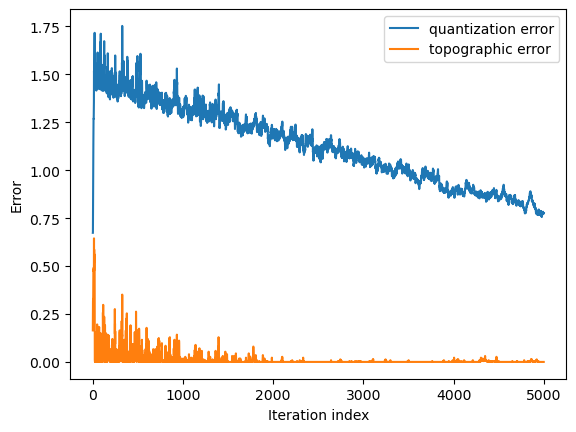

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.8748340344370586


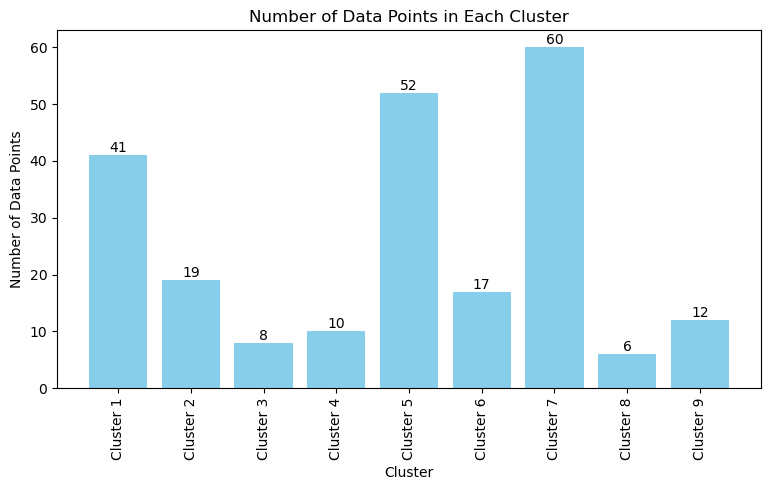

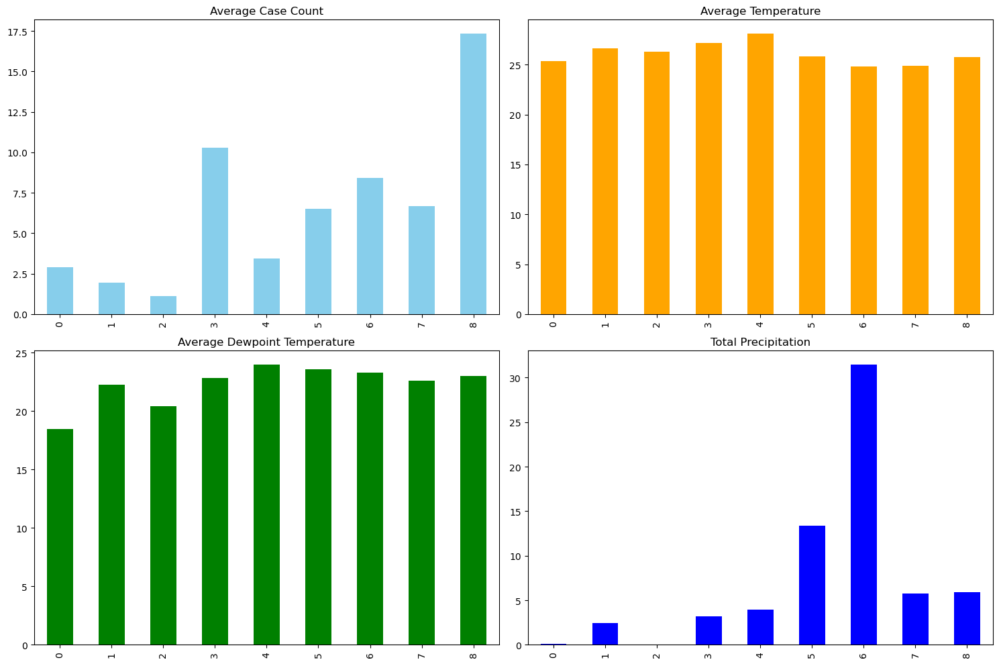

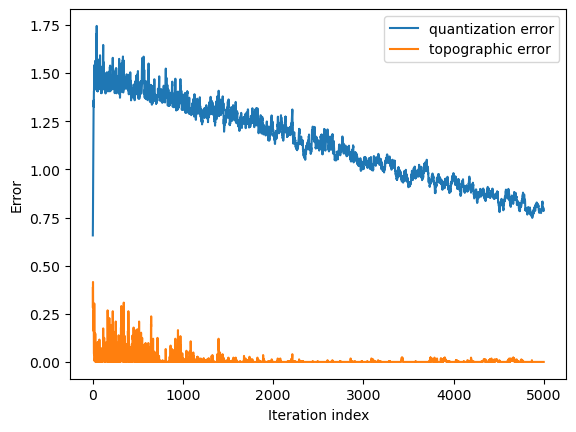

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.8259496508940908


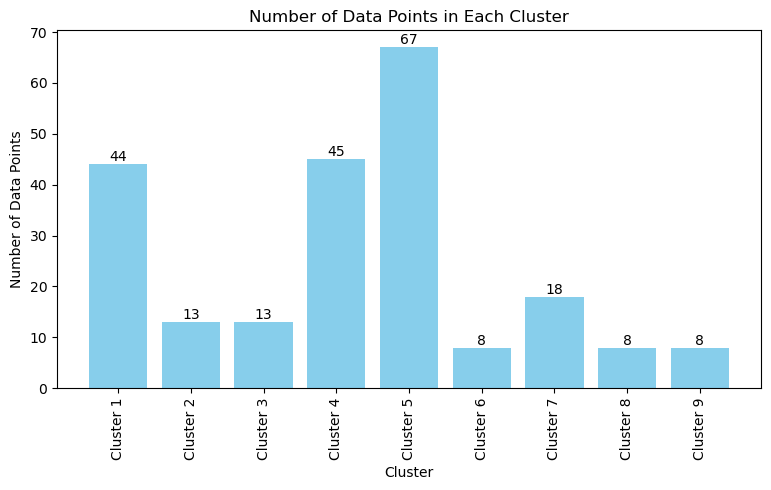

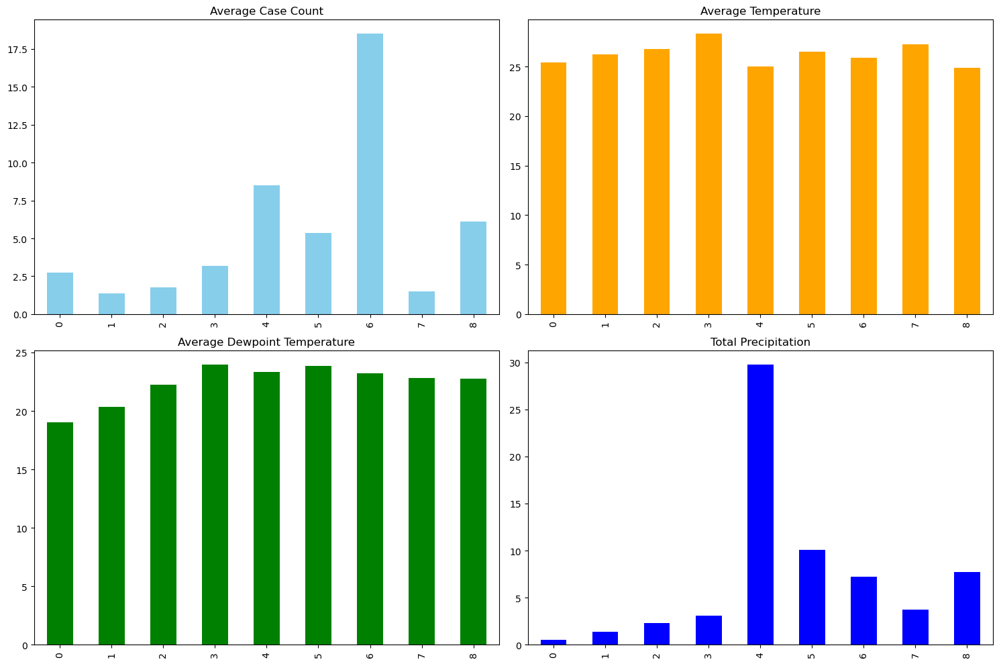

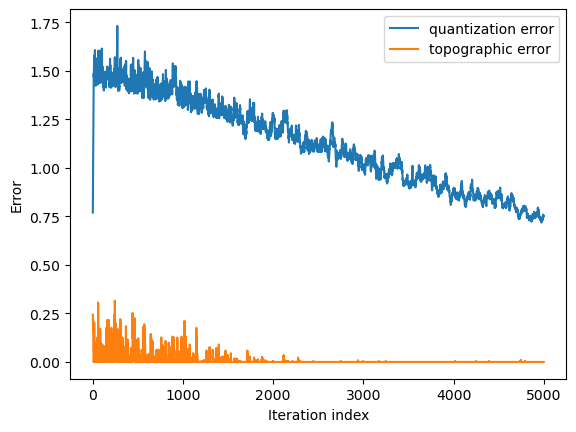

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.7698512268923792


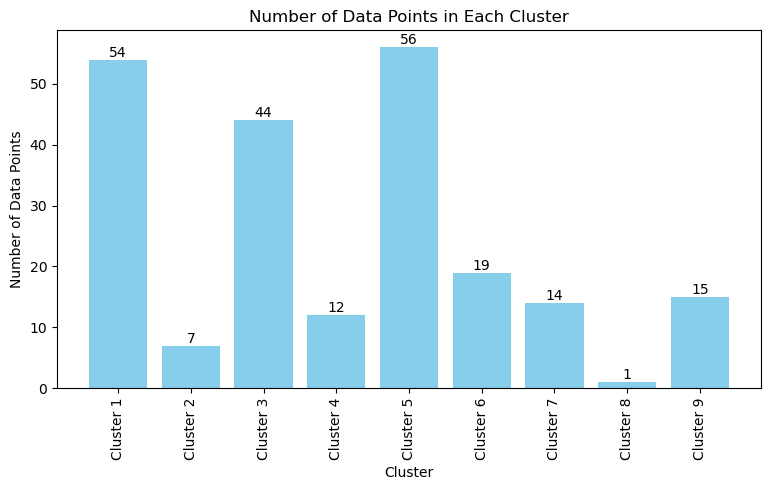

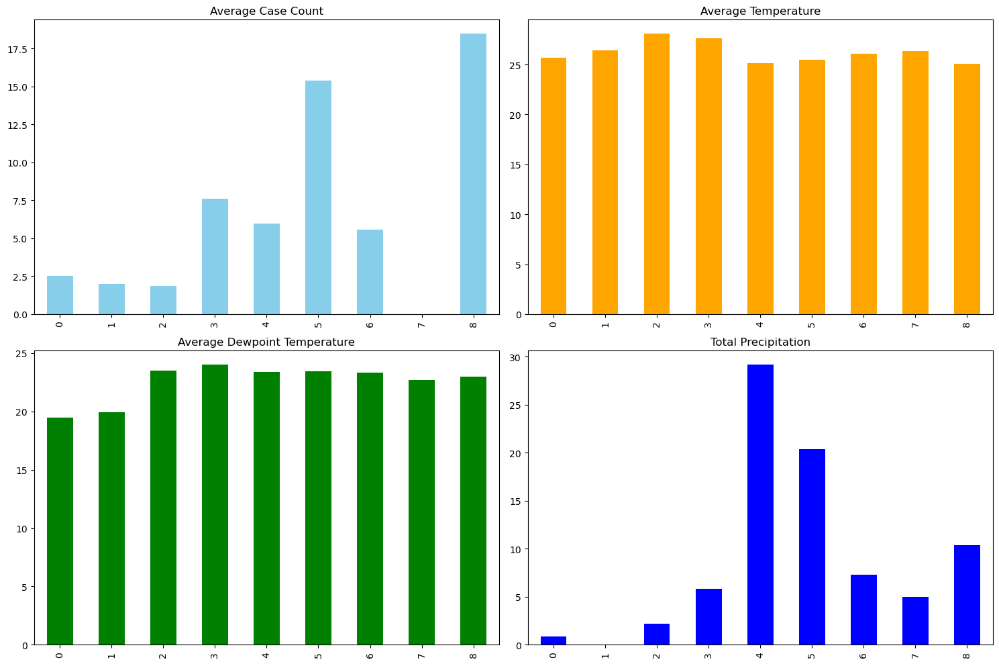

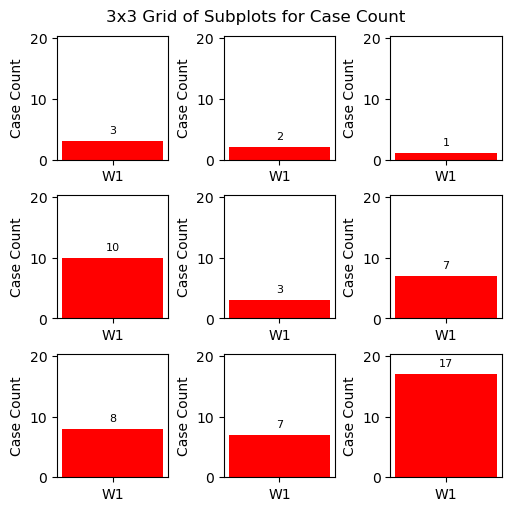

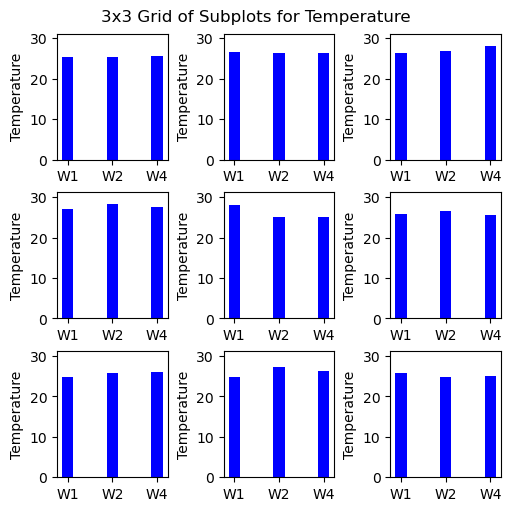

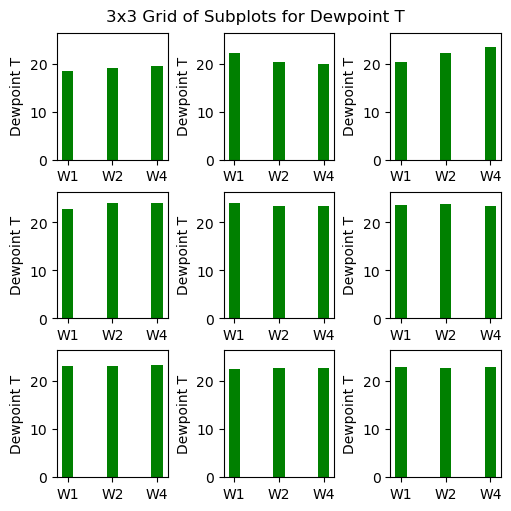

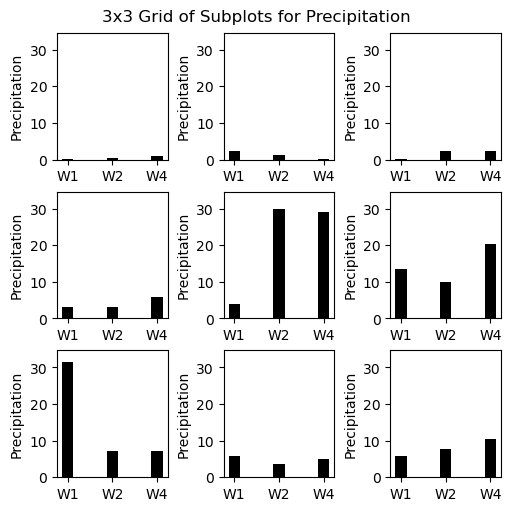

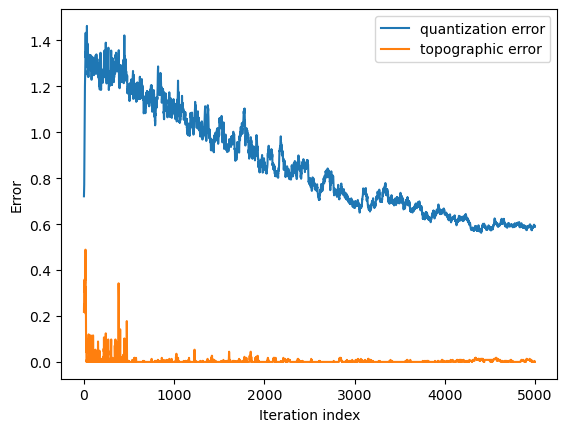

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.6605085096102895


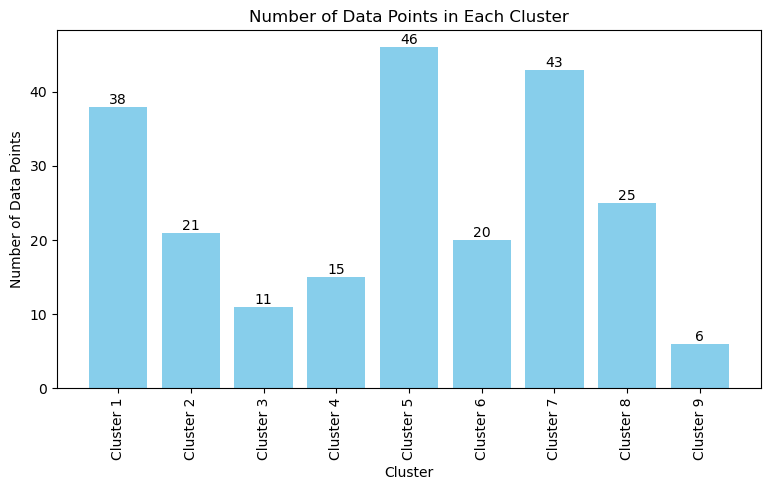

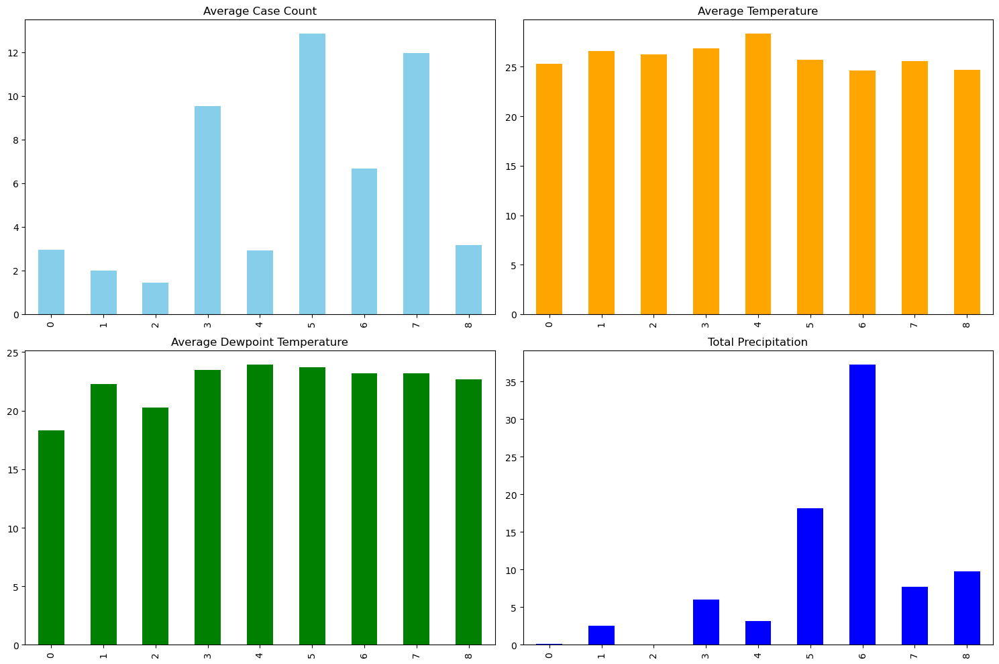

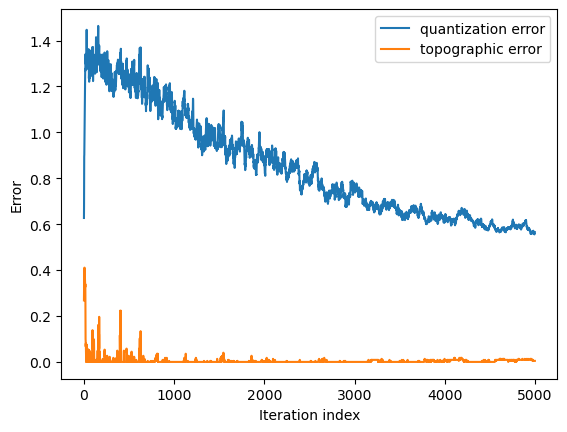

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.6376121158462867


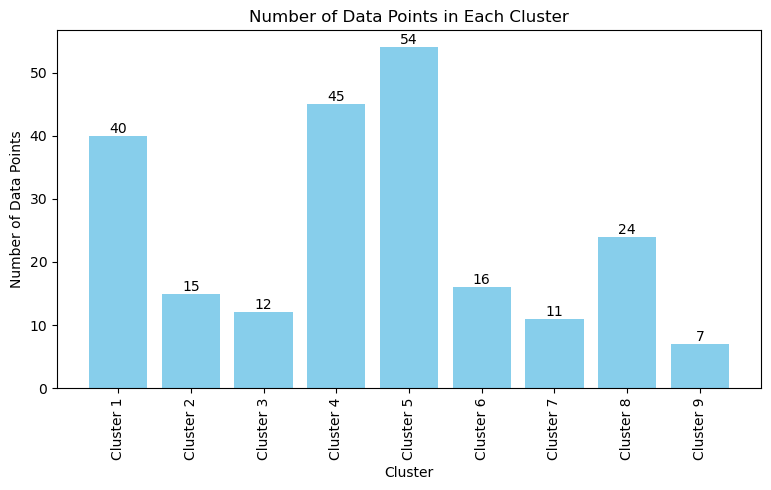

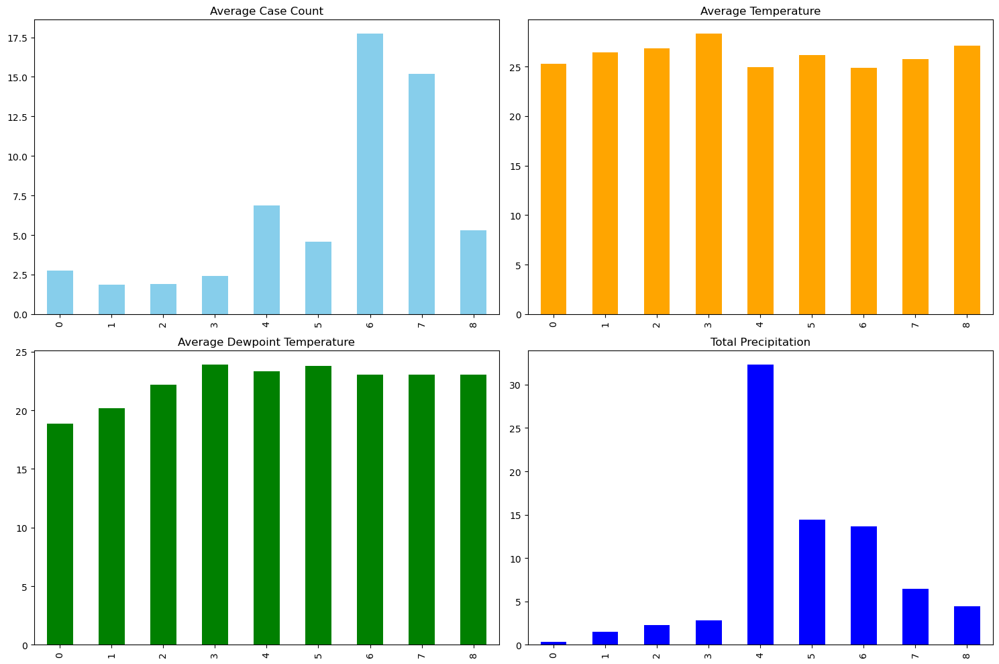

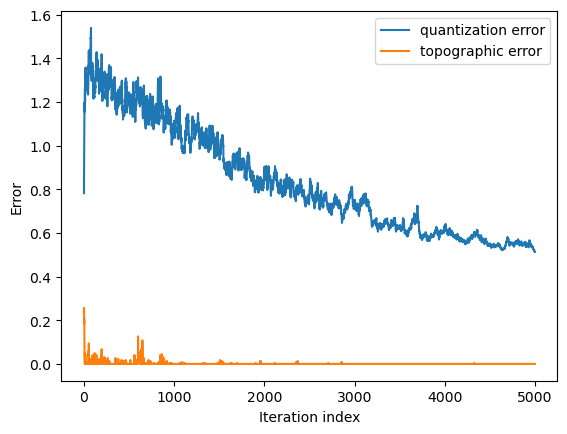

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 0.5422362605945218


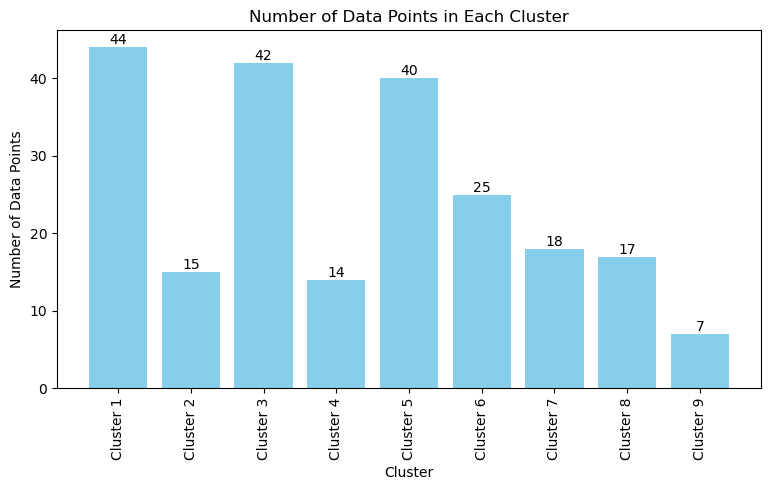

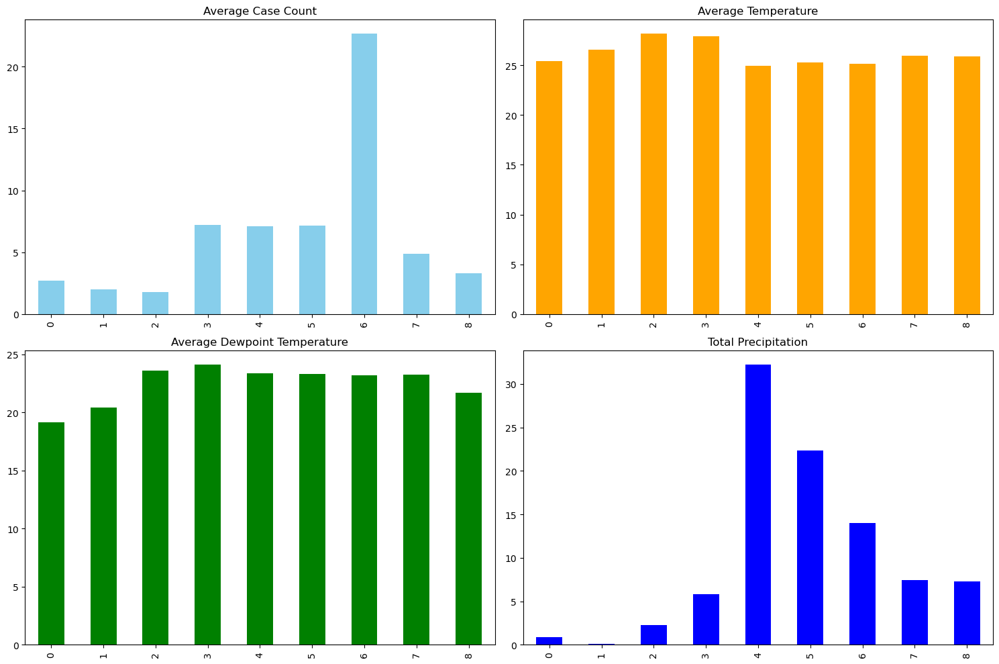

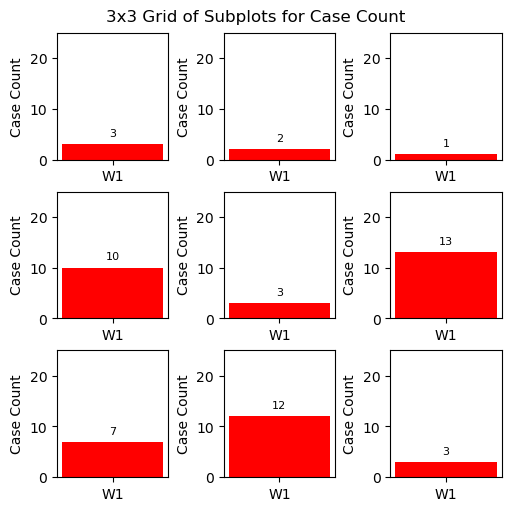

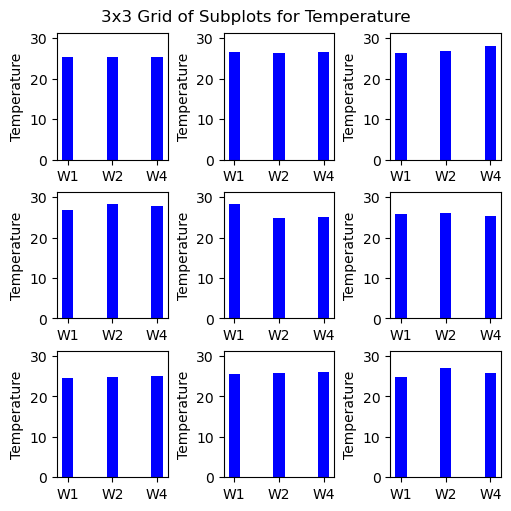

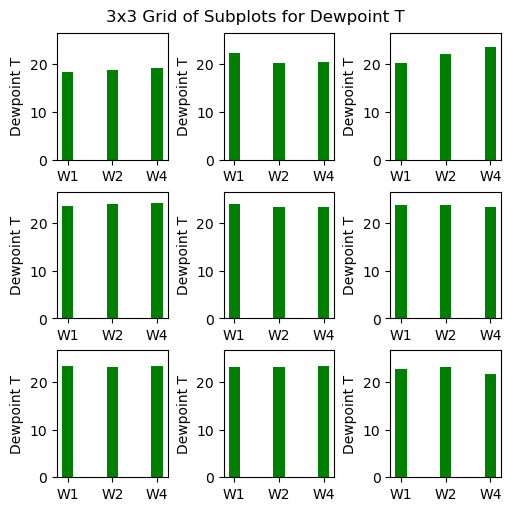

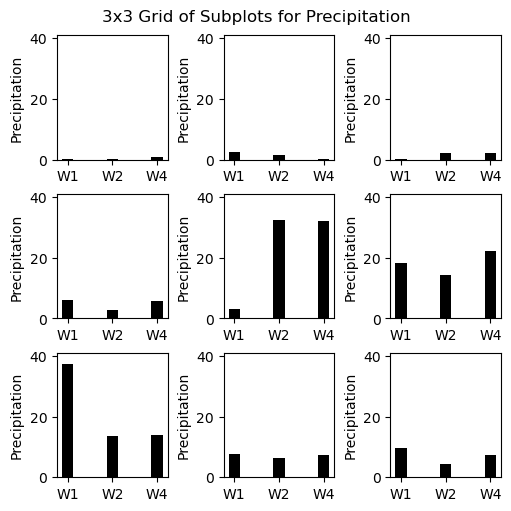

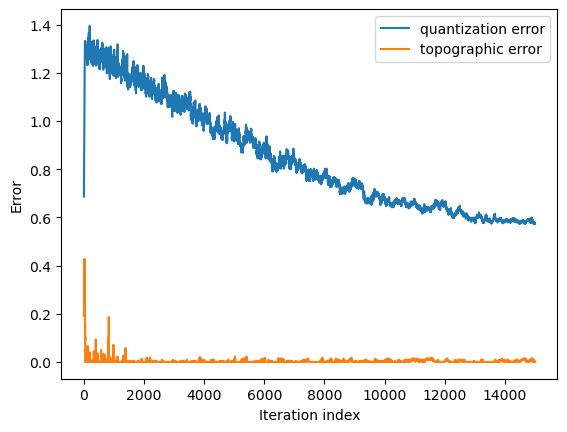

 [ 14836 / 15000 ]  99% - 0:00:00 left 

 [ 15000 / 15000 ] 100% - 0:00:00 left 
 quantization error: 0.6295287867697983


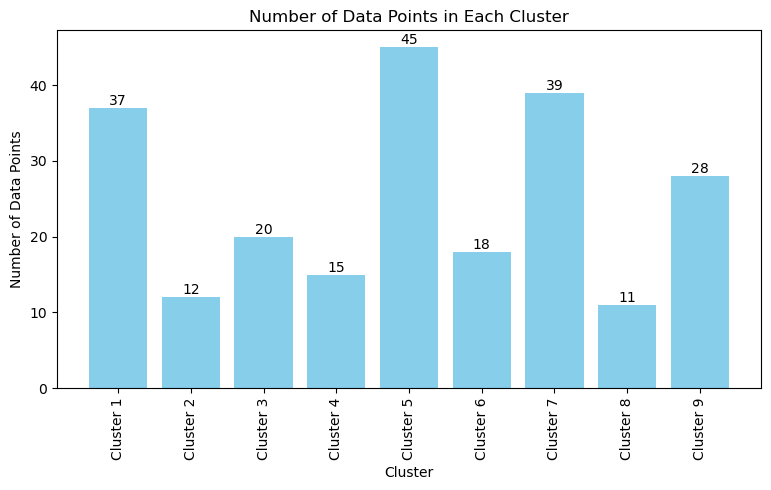

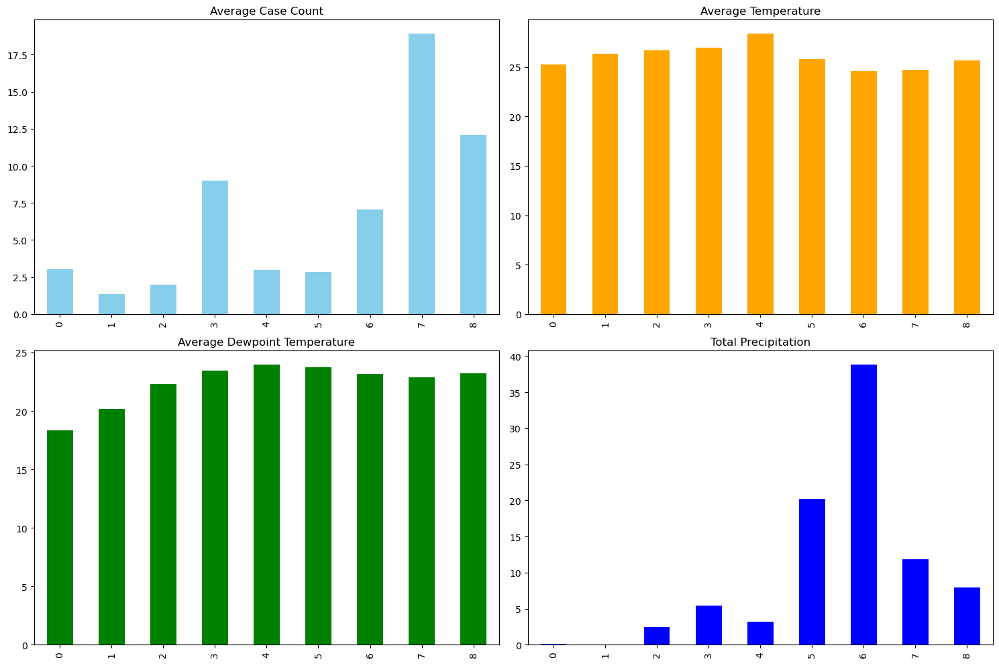

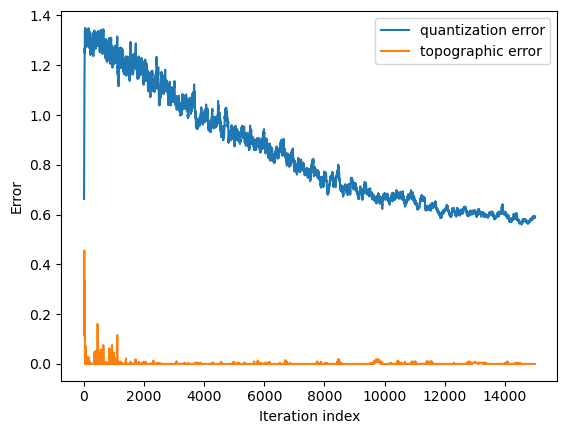

 [ 15000 / 15000 ] 100% - 0:00:00 left 
 quantization error: 0.6098356369389958


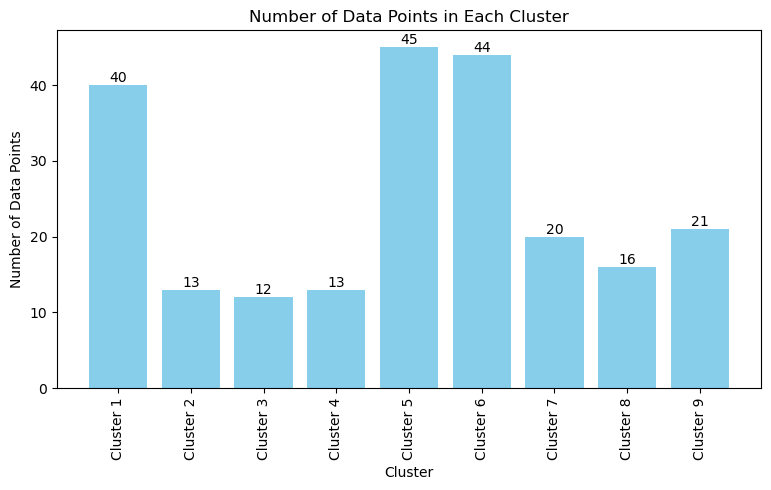

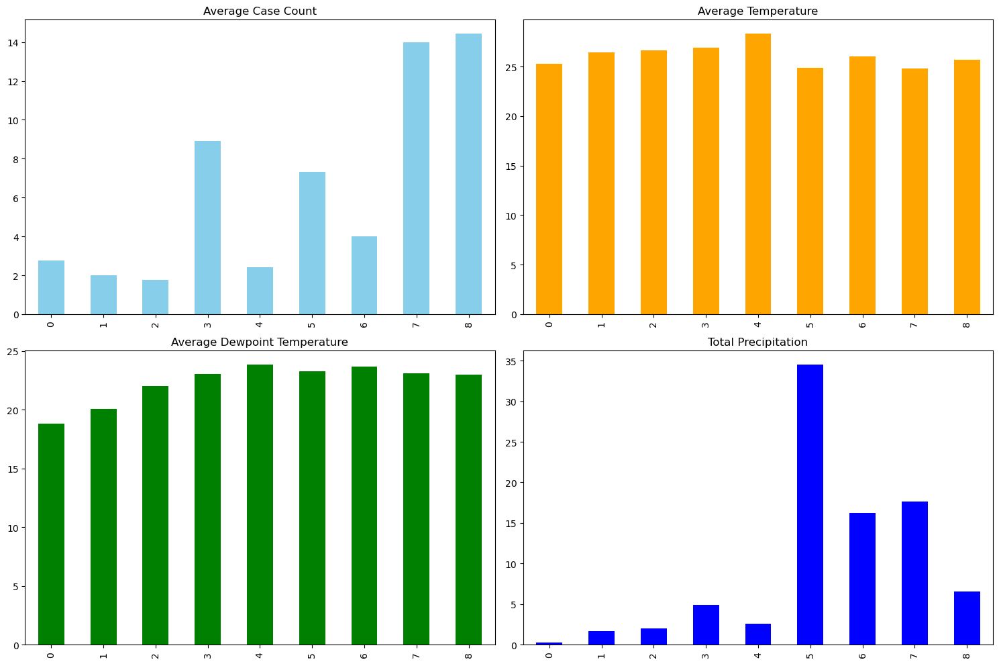

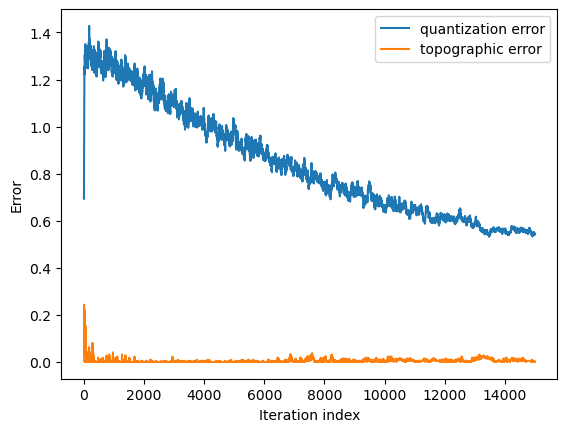

 [ 15000 / 15000 ] 100% - 0:00:00 left 
 quantization error: 0.526962516467861


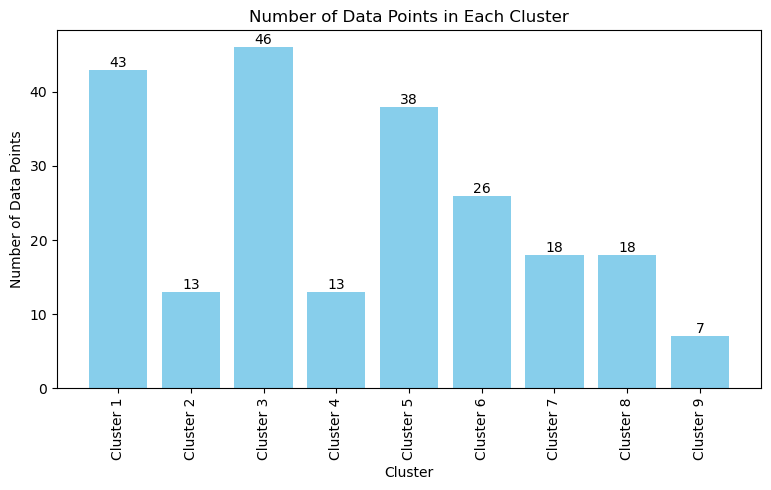

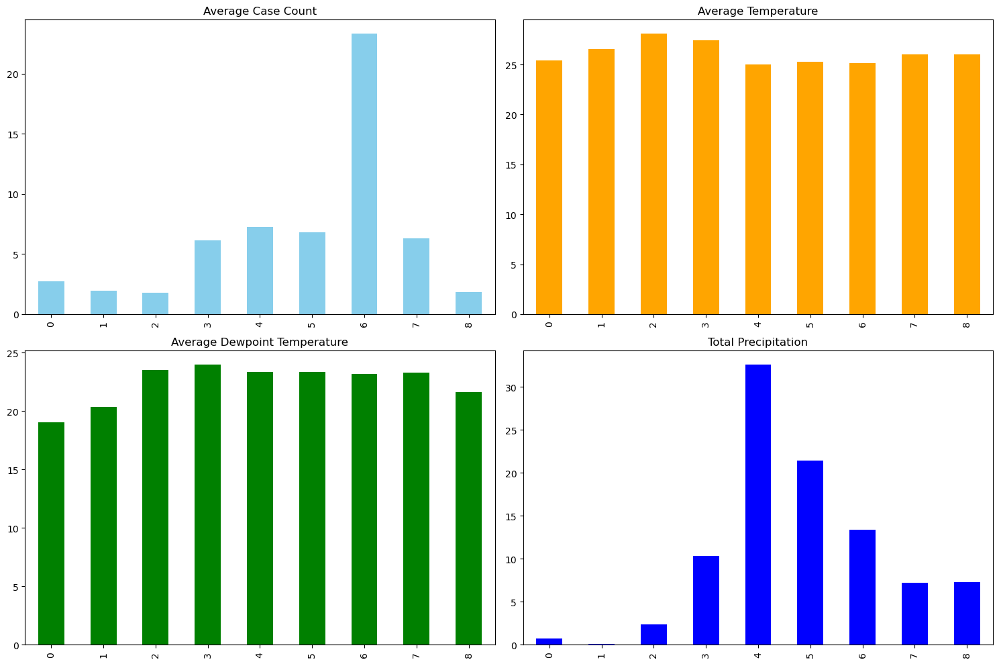

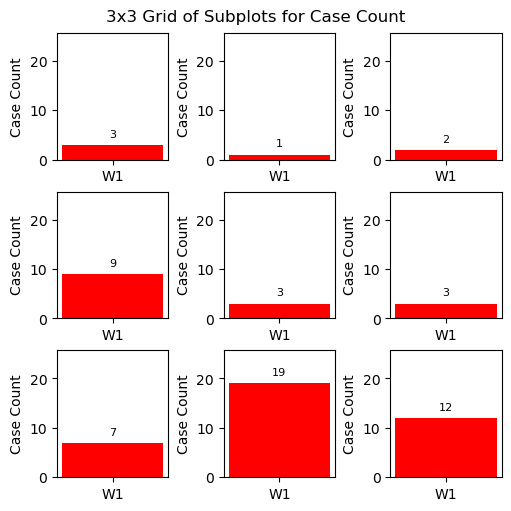

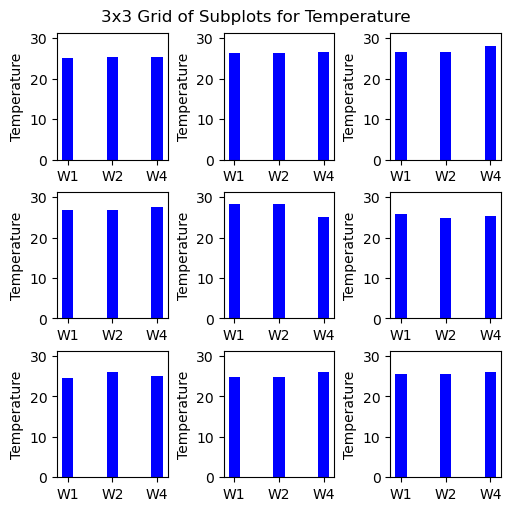

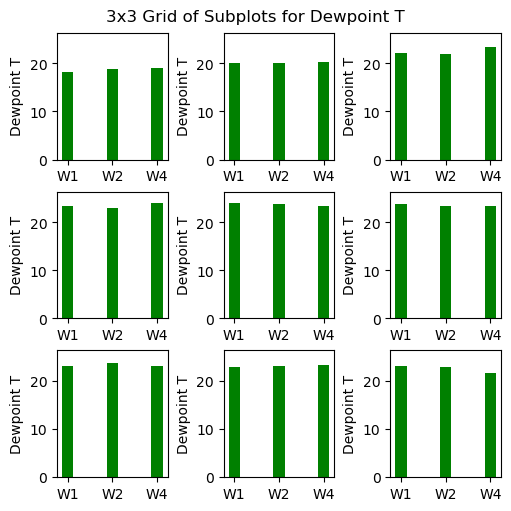

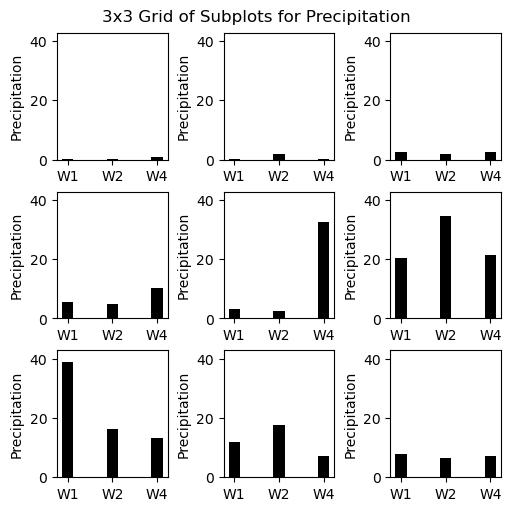

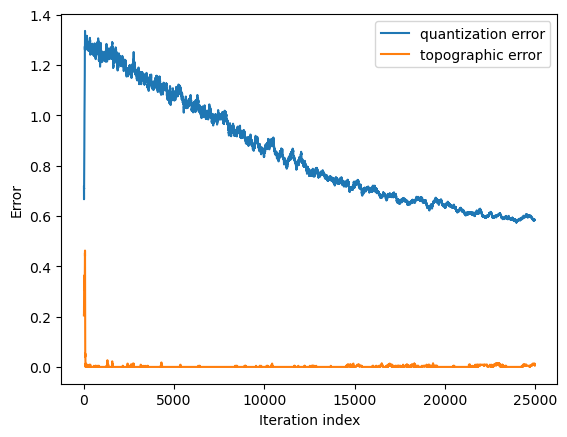

 [ 15110 / 25000 ]  60% - 0:00:00 left 

 [ 25000 / 25000 ] 100% - 0:00:00 left 
 quantization error: 0.5747003212567647


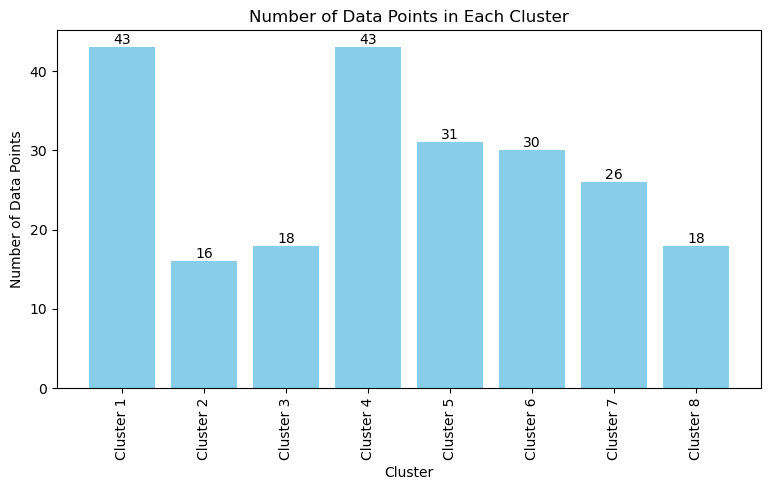

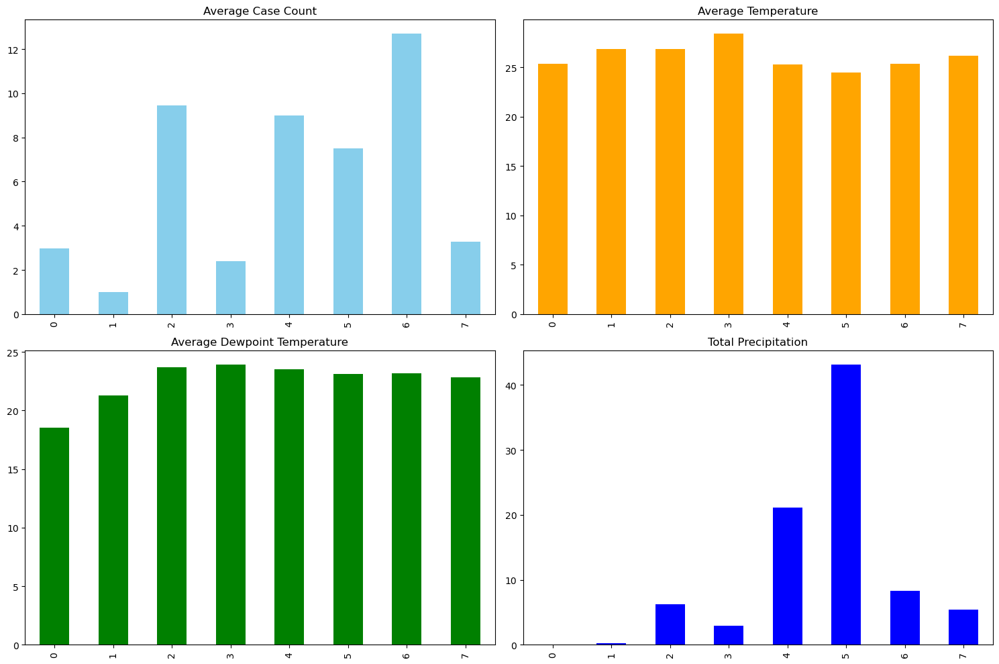

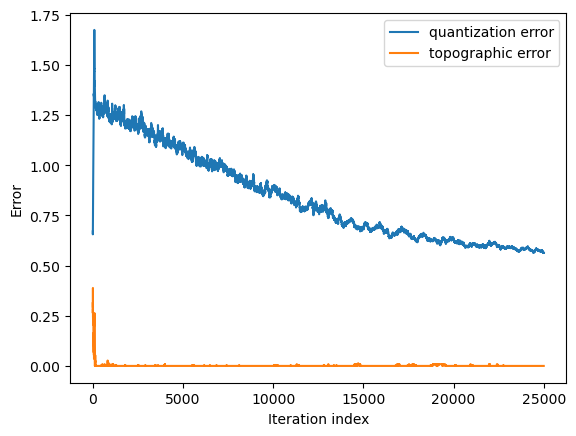

 [ 13984 / 25000 ]  56% - 0:00:00 left 

 [ 25000 / 25000 ] 100% - 0:00:00 left 
 quantization error: 0.5671994138531913


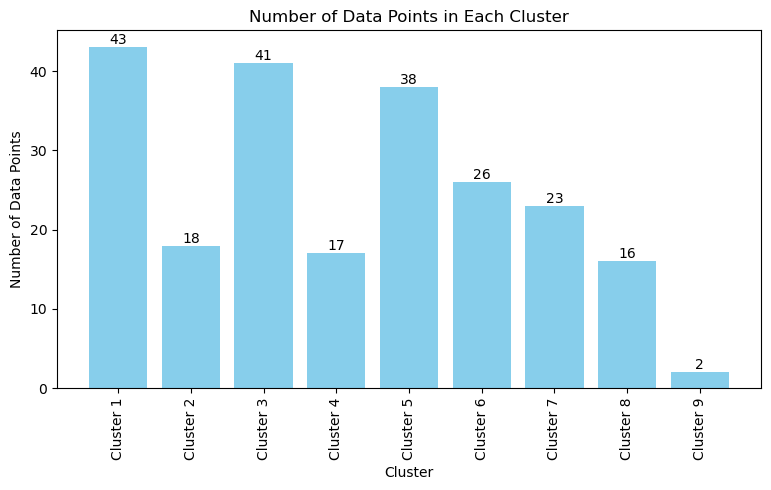

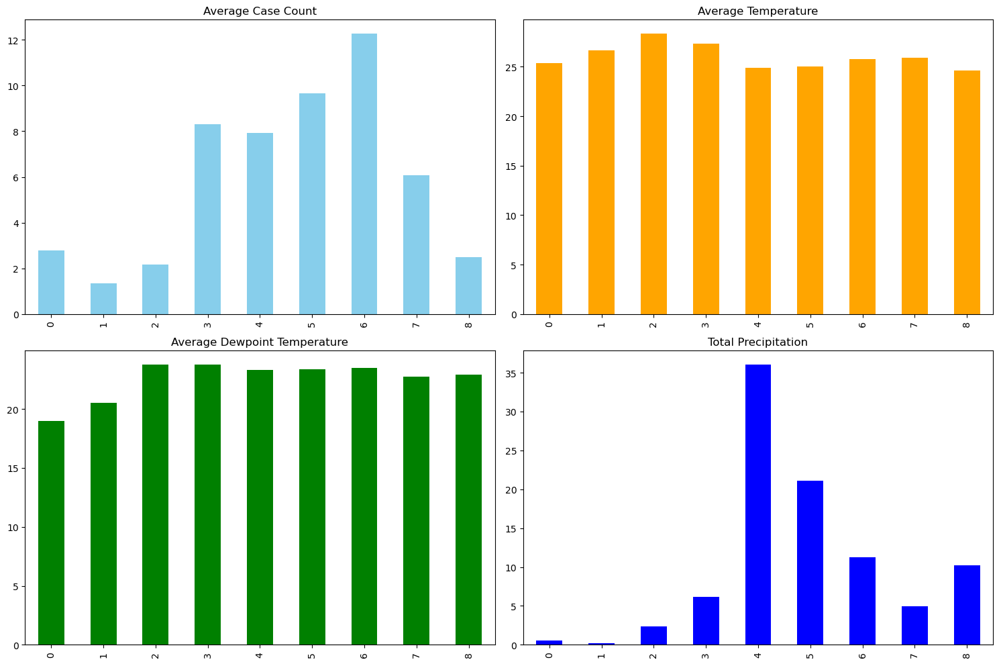

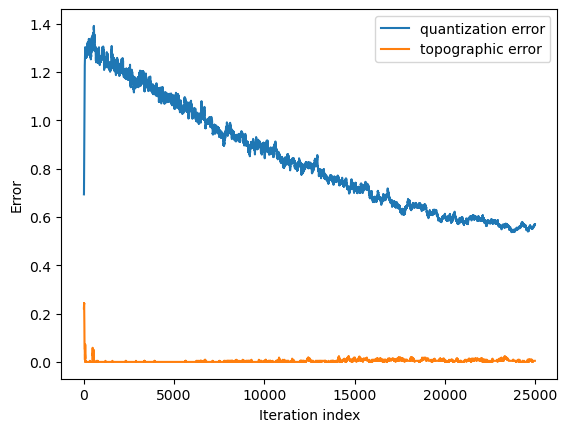

 [ 21786 / 25000 ]  87% - 0:00:00 left 

 [ 25000 / 25000 ] 100% - 0:00:00 left 
 quantization error: 0.5389285545467541


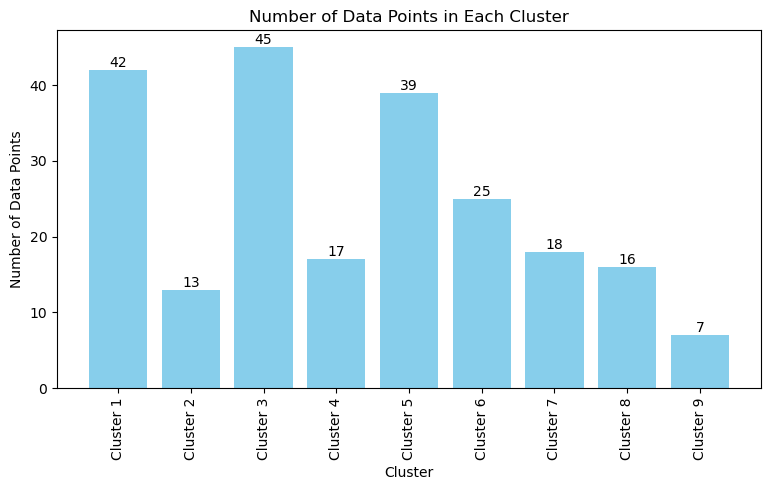

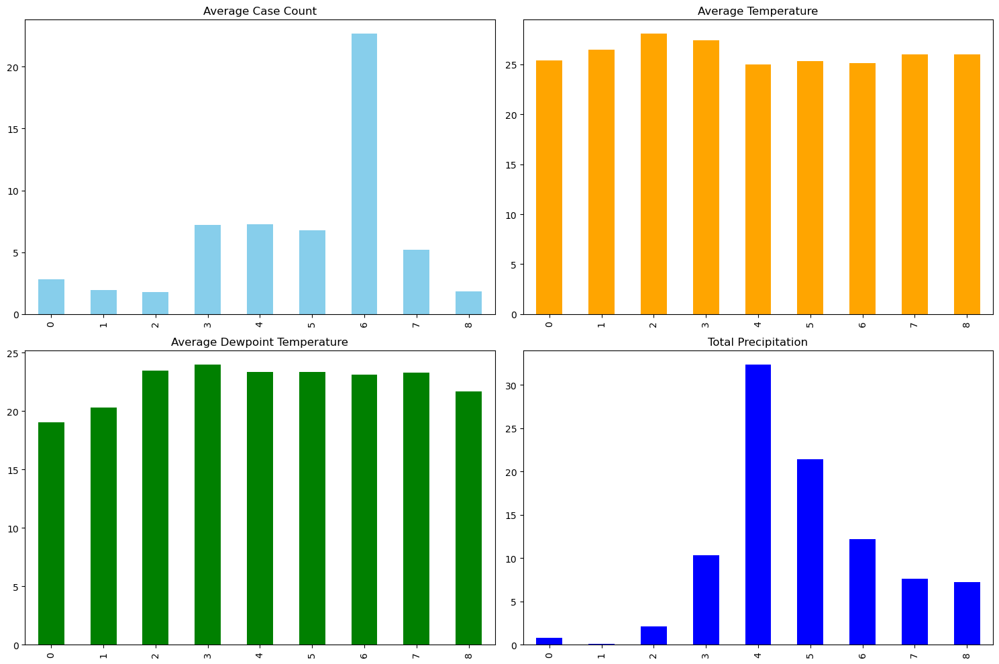

IndexError: single positional indexer is out-of-bounds

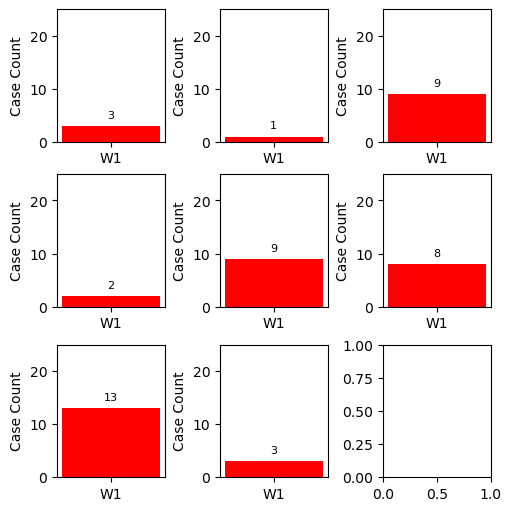

In [77]:
for i in range(5):
    plots(district_data, 3,hyp[i][0],hyp[i][1],hyp[i][2])  

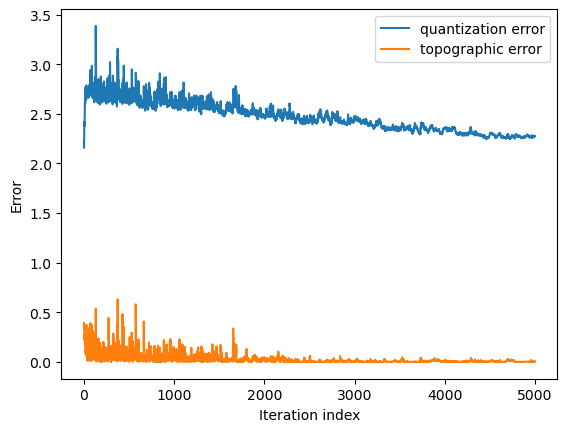

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 2.415838832393267


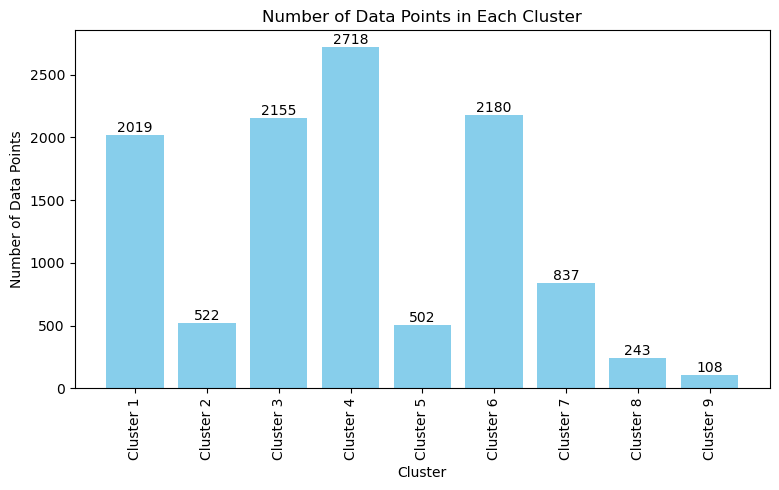

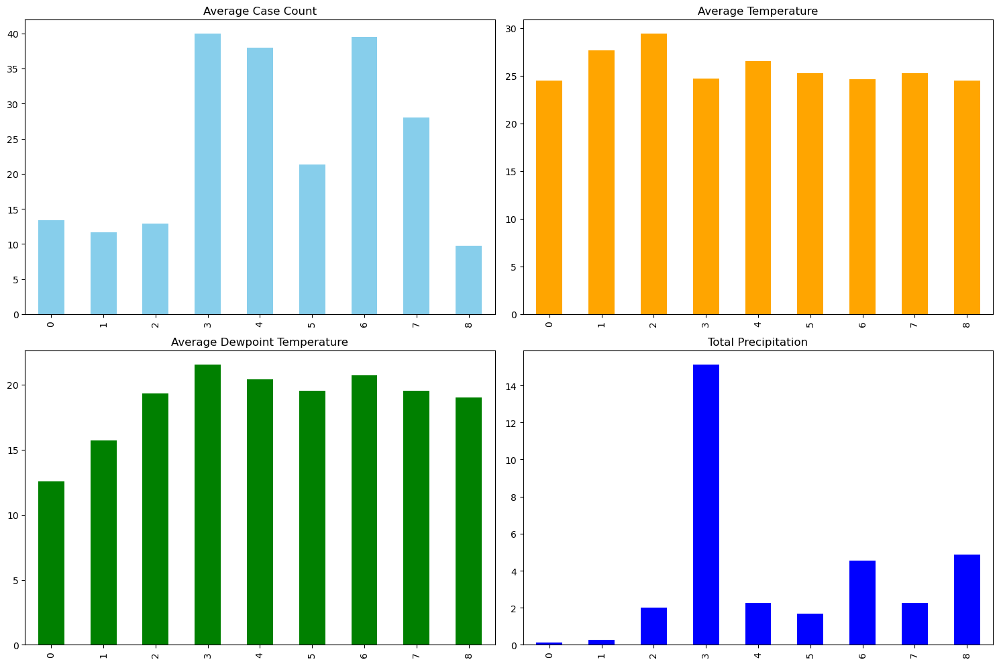

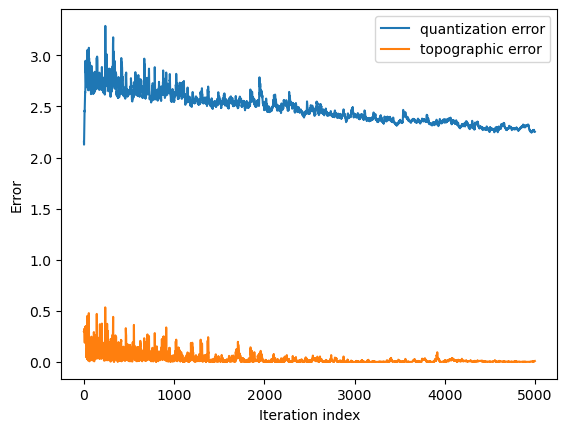

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 2.4250139011587954


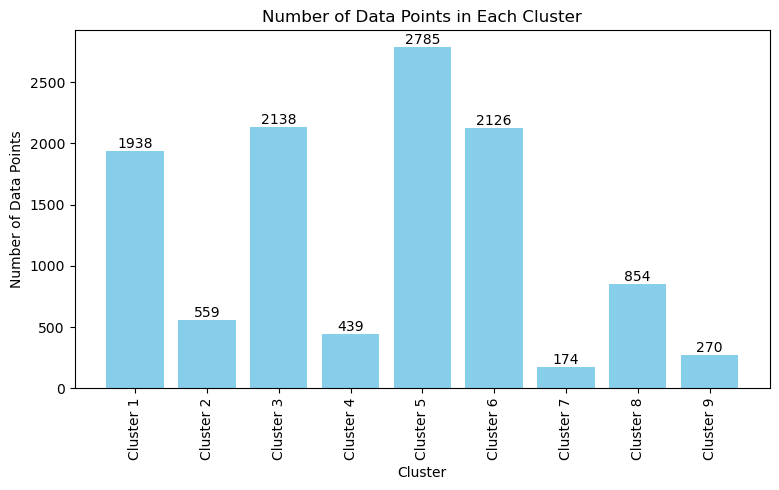

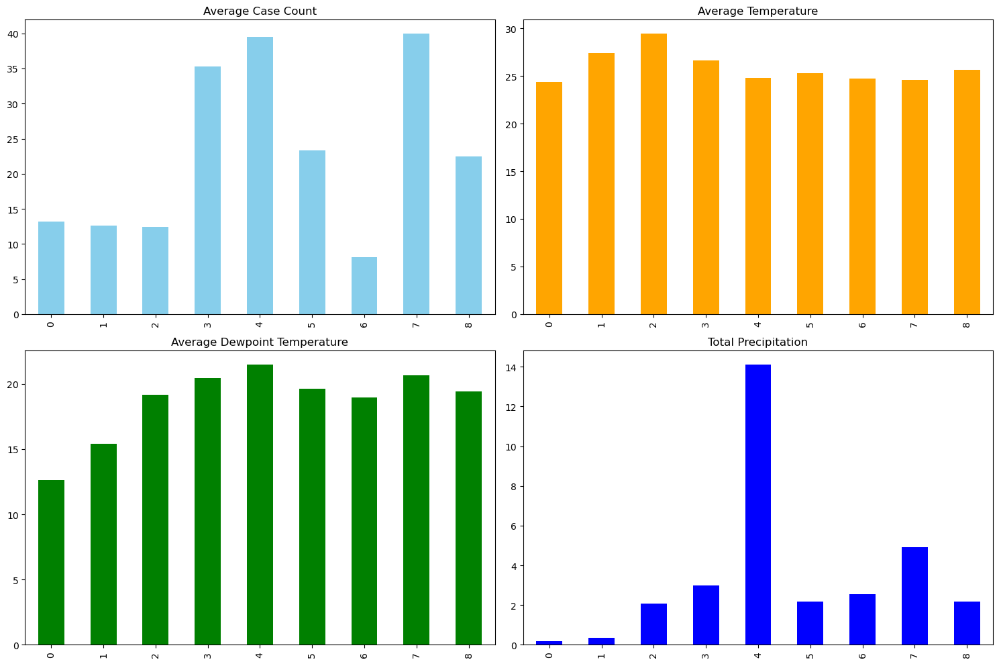

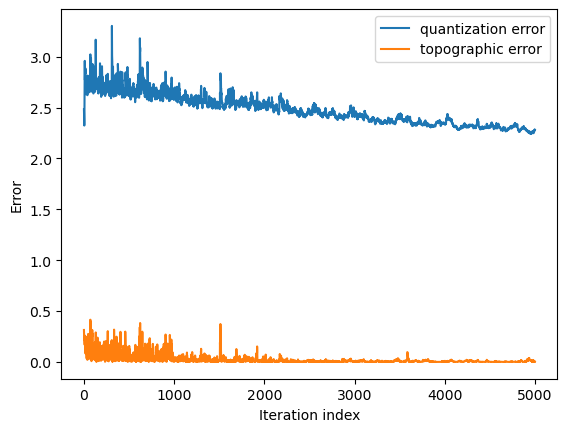

 [ 5000 / 5000 ] 100% - 0:00:00 left 
 quantization error: 2.4163770732868186


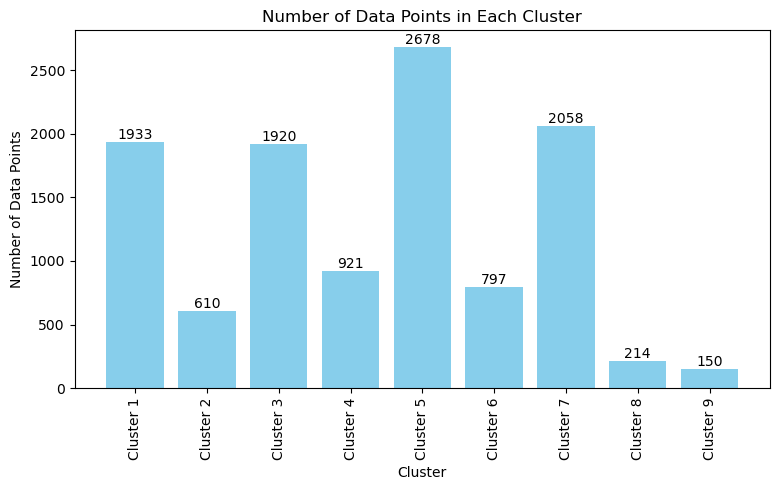

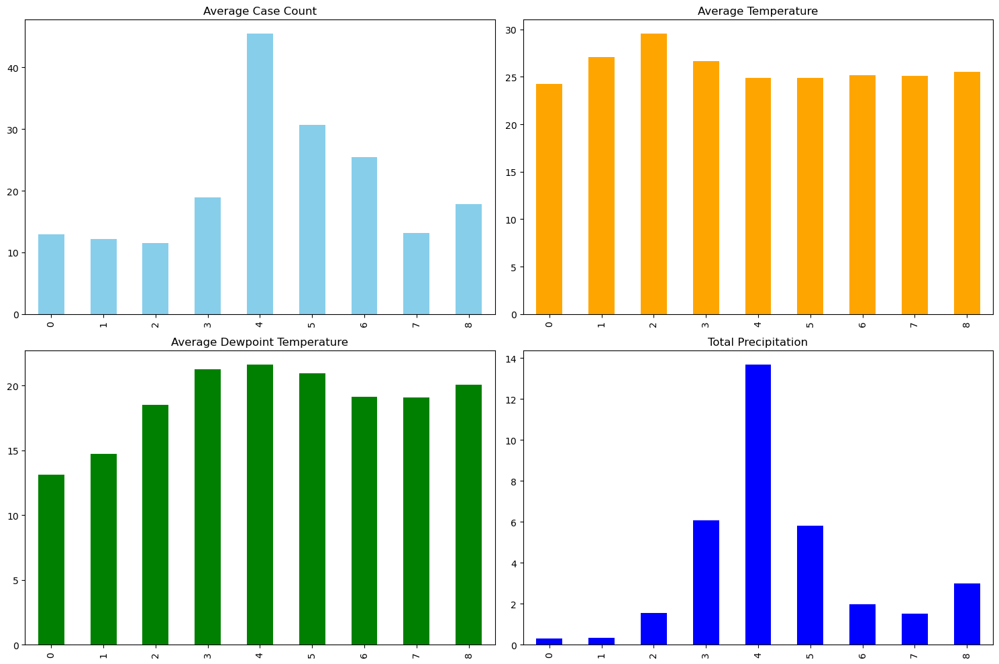

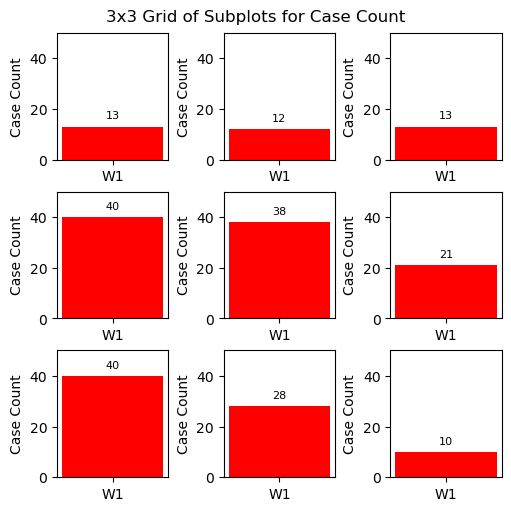

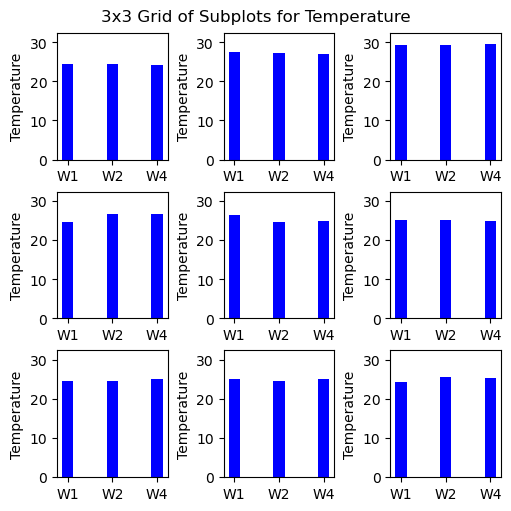

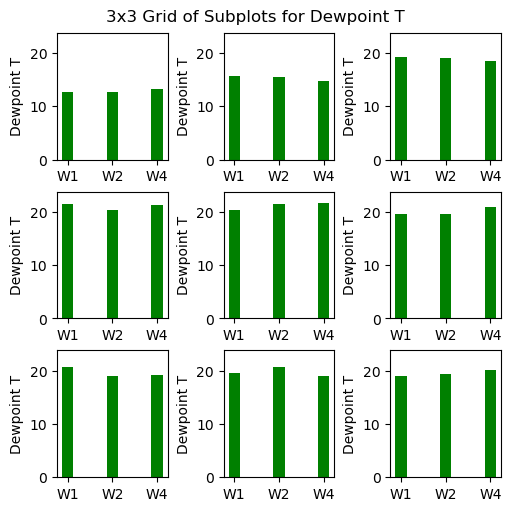

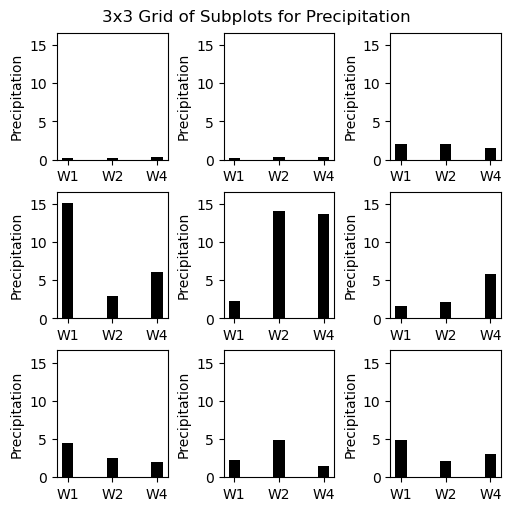

   Case Count  Temperature  Dewpoint T  Precipitation
0   13.403486    24.479259   12.575597       0.136125
1   11.679472    27.630064   15.708068       0.256438
2   12.878243    29.409984   19.324086       2.005641
3   39.949818    24.707482   21.555526      15.133627
4   37.934755    26.503942   20.387420       2.243919
5   21.338384    25.255142   19.531520       1.681050
6   39.517702    24.658073   20.718865       4.536323
7   28.002453    25.236635   19.513859       2.244699
8    9.720898    24.512153   19.023688       4.865628


In [70]:
def plots(df, noc, iterations, learning_rate, sigma):
    # Renamed variable to avoid conflict
    w1, sf1 = weekly_avg(df, 1)
    w2, sf2 = weekly_avg(df, 2)
    w4, sf4 = weekly_avg(df, 4)
   
    # Assuming train_and_analyze_soms and plot_variables are defined elsewhere
    cluster_values_dfs = train_and_analyze_soms(noc, df, sf1, sf2, sf4, train_som, get_cluster_info, calculate_statistics, sigma, learning_rate, iterations)
    df1 = cluster_values_dfs['sf1']
    df2 = cluster_values_dfs['sf2']
    df4 = cluster_values_dfs['sf4']
    plot_variables(df1, df2, df4, 3)
    return df1, df2, df4

# Call the plots function and assign the returned values to df1, df2, and df4
df1, df2, df4 = plots(df, 3, hyp[0][0], hyp[0][1], hyp[0][2])

# Now df1, df2, and df4 should be defined and accessible
print(df1)  # Check if df1 is defined and contains the expected data
